# scArches - Reference Mapping - Control 10x-V3 Query

In [2]:
import scanpy as sc
import anndata
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import scarches as sca
import torch
from scipy import sparse
import copy as cp
import scib

sc.settings.set_figure_params(dpi=200, frameon=False)
sc.set_figure_params(dpi=200)
sc.set_figure_params(figsize=(4, 4))
torch.set_printoptions(precision=3, sci_mode=False, edgeitems=7)

Purpose: build a reference map using a PBMC compiled dataset that is pre-labeled

then query using the control datasets to see how they compare 

https://github.com/theislab/scarches-reproducibility

https://www.nature.com/articles/s41587-021-01001-7

follow the code in reproduciibility to make the scArches reference map 

Run this on the cluster using python script 

"scVI_scArches_reference_model_Control_.py" 

The scVI model for the reference atlas was already generated

Import both of the models as well as the data to begin the analysis and comparison

In [34]:
#the count matrix is alread normalized 
rare = sc.read_h5ad('scArches_reference_mapping/rare_pdc_pbmc.h5ad')
#subset to only the PBMC and not the bone marrow samples
rare = rare[rare.obs['tissue']=='PBMCs']

#freeze the normalized counts
rare.layers['normalized'] = rare.X.copy()
rare.X = rare.raw.X

#here is the list of genes not found in both datasets
#need to be removed from both datasets
genes_na = ['IGLL5', 'FAM129C', 'FAM198B', 'PLA2G16', 'KIAA1468', 'SEPT4', 'TMEM56', 'FAM129A', 
 'COL4A3BP', 'CTGF', 'FAM84B', 'HRASLS2', 'FAM45A', 'PQLC3', 'DIRC2', 'KLRC4-KLRK1', 
 'RARRES3', 'FAM173A', 'DOPEY2', 'MUM1', 'HEXDC', 'HIF1A-AS2', 'HKR1', 'ATP5S', 'SSFA2', 
 'ALS2CR12', 'TROVE2', 'SEPT1', 'SEPT10']

#subset to only the genes found in both
rare_genes_scVI = [gene for gene in list(rare.var_names) if gene not in genes_na]
rare = rare[:,rare_genes_scVI]
rare = rare.copy()
rare

/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/_io/specs/methods.py:584: OldFormatWarning: Element '/obs/__categories/batch' was written without encoding metadata.
  categories = read_elem(categories_dset)
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/_io/specs/methods.py:587: OldFormatWarning: Element '/obs/batch' was written without encoding metadata.
  read_elem(dataset), categories, ordered=ordered
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/_io/specs/methods.py:584: OldFormatWarning: Element '/obs/__categories/chemistry' was written without encoding metadata.
  categories = read_elem(categories_dset)
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/_io/specs/methods.py:587: OldFormatWarning: Element '/obs/chemistry' was written without encoding metadata.
  read_elem(dataset), categories, ordered=ordered
/Users/jbezney/opt/anaconda3/envs/scarches/lib/pyt

AnnData object with n_obs × n_vars = 22811 × 3971
    obs: 'batch', 'chemistry', 'data_type', 'dpt_pseudotime', 'final_annotation', 'mt_frac', 'n_counts', 'n_genes', 'sample_ID', 'size_factors', 'species', 'study', 'tissue', 'condition'
    layers: 'normalized'

In [35]:
vae = sca.models.SCVI.load('scArches_reference_mapping/reference_PBMC_scVI_scArches_model/', rare)

INFO     File scArches_reference_mapping/reference_PBMC_scVI_scArches_model/model.pt already downloaded            


In [36]:
reference_latent = sc.AnnData(vae.get_latent_representation())
reference_latent.obs["cell_type"] = rare.obs['final_annotation'].tolist()
reference_latent.obs["batch"] = rare.obs['batch'].tolist()

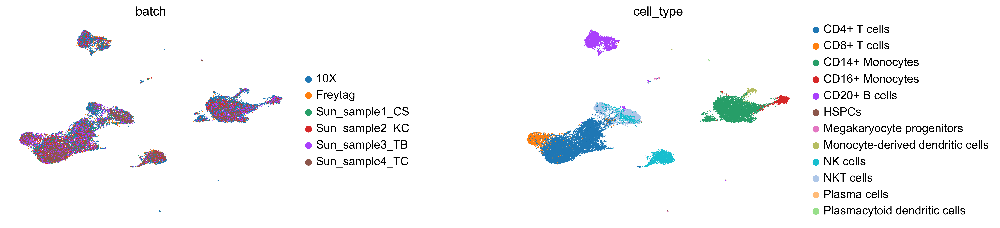

In [37]:
sc.pp.neighbors(reference_latent, n_neighbors=15)
sc.tl.leiden(reference_latent)
sc.tl.umap(reference_latent, min_dist=0.1)
sc.pl.umap(reference_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

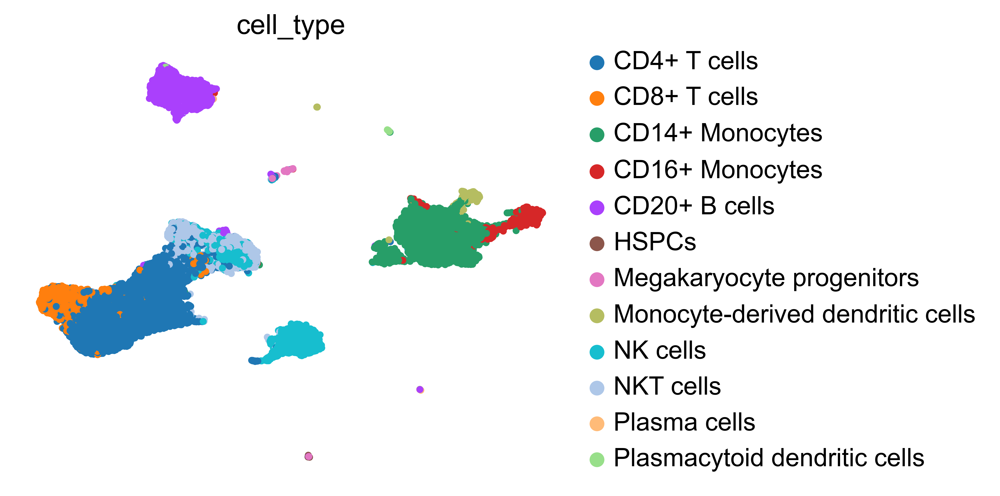

In [38]:
sc.pl.umap(reference_latent,
           color=['cell_type'],
           frameon=False,
           wspace=0.6,
           size = 50,
           )

In [41]:
#standard
data = sc.read_10x_h5('raw_files/FUll_transcriptome/Control_not_masked_filtered_feature_bc_matrix.h5')
data.var_names_make_unique()
#remove the cells that are not incorporated into the full dataset
#bring in the annotations from Azimuth reference labeling 
annotations = pd.read_csv('Azimuth_annotations/control_cell_labels.csv')
anno_list = list(annotations['Unnamed: 0'])
barcode=[]
rep = []
for label in anno_list:
    name1,name2,name3 = label.split('_')
    barcode.append(name3)
    rep.append(name2)
annotations['rep'] = rep
annotations['barcode'] = barcode
annotations = annotations[annotations['rep']=='rep2']
annotations = annotations.set_index('barcode')

#add the labels to the anndata and remove unlabeled (previously filtered)
data.obs['seurat_clusters'] = annotations['identities_control']
cell_types = list(data.obs['seurat_clusters'].unique())
cell_types = [x for x in cell_types if str(x) != 'nan']
data = data[data.obs['seurat_clusters'].isin(cell_types)]

#set the batch 
data.obs['batch'] = 'Standard'
#rename 56 bright to CD56 bright 
data.obs['seurat_clusters'] = data.obs['seurat_clusters'].replace('NK_56bright','NK_CD56bright')

#subset to only the genes found in both 
data = data[:,rare_genes_scVI]
data = data.copy()
data

/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/_core/anndata.py:1830: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_62339/1059832110.py:26: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  data.obs['batch'] = 'Standard'


AnnData object with n_obs × n_vars = 10184 × 3971
    obs: 'seurat_clusters', 'batch'
    var: 'gene_ids', 'feature_types', 'genome'

In [42]:
model = sca.models.SCVI.load('scArches_reference_mapping/query_PBMC_Control_scVI_scArches_model/', data)

INFO     File scArches_reference_mapping/query_PBMC_Control_scVI_scArches_model/model.pt already downloaded        


In [43]:
#label the cell types according to already labeled
query_latent = sc.AnnData(model.get_latent_representation())
query_latent.obs['cell_type'] = data.obs['seurat_clusters'].tolist()
query_latent.obs['batch'] = data.obs['batch'].tolist()

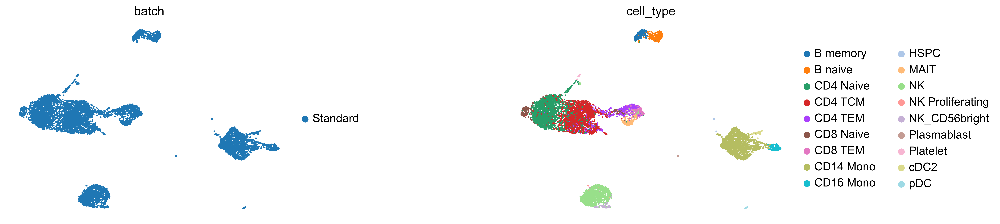

In [44]:
sc.pp.neighbors(query_latent, n_neighbors=15)
sc.tl.leiden(query_latent)
sc.tl.umap(query_latent, min_dist=0.1)
sc.pl.umap(query_latent,
           color=['batch', 'cell_type'],
           frameon=False,
           wspace=0.6,
           )

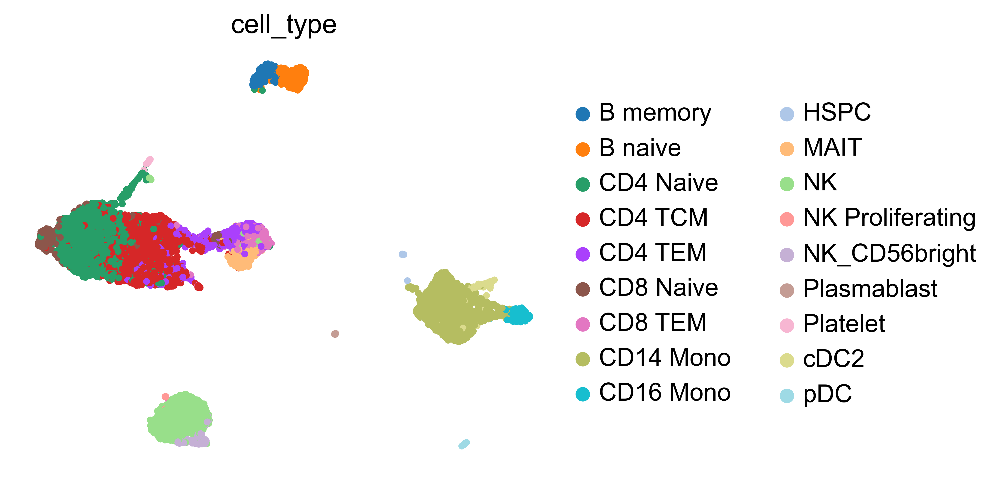

In [45]:
sc.pl.umap(query_latent,
           color='cell_type',
           frameon=False,
           wspace=0.6,
           size=50
           )

In [46]:
#combine the two datasets
adata_full = anndata.concat([rare,data])
#add the cell labels from the control
adata_full.obs['final_annotation'] = data.obs['seurat_clusters']
#add the cell labels from the reference
obs_df = pd.DataFrame(adata_full.obs.astype(object))
rare_df = pd.DataFrame(rare.obs.astype(object))
df3 = obs_df.loc[obs_df['final_annotation'].isnull()].merge(rare_df, left_index=True, right_index=True)
obs_df['scCLEAN Cell Types'] = obs_df['final_annotation'].fillna(df3['final_annotation_y'])
adata_full.obs['scCLEAN Cell Types'] = obs_df['scCLEAN Cell Types']

full_latent = sc.AnnData(model.get_latent_representation(adata=adata_full))

full_latent.obs['cell_type'] = adata_full.obs['scCLEAN Cell Types'].tolist()
full_latent.obs['batch'] = adata_full.obs['batch'].tolist()

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/_core/merge.py:942: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(


13


<Figure size 1500x1200 with 0 Axes>

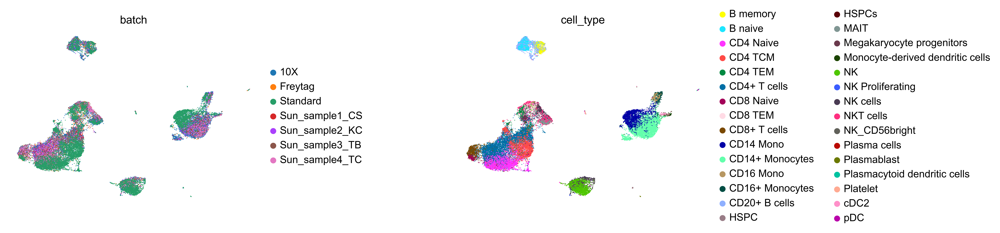

In [47]:
#overlay the two
sc.pp.neighbors(full_latent, n_neighbors=15)
sc.tl.leiden(full_latent, resolution=0.5)
print(len(full_latent.obs['leiden'].unique()))
sc.tl.umap(full_latent, min_dist=0.1)
plt.figure()
sc.pl.umap(
    full_latent,
    color=["batch",'cell_type'],
    frameon=False,
    wspace=0.6,
)

/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


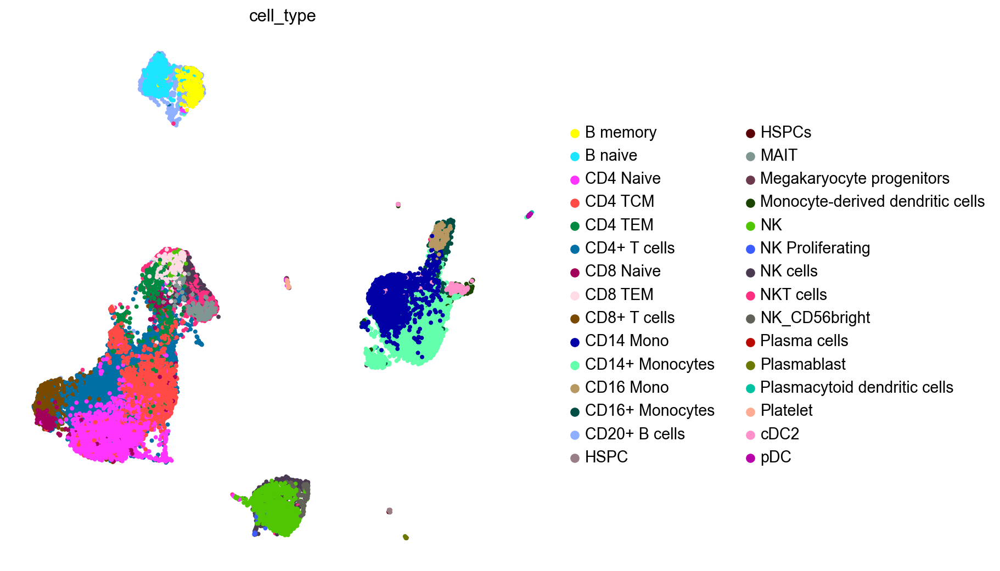

In [48]:
sc.set_figure_params(figsize=(8,8))
sc.pl.umap(
    full_latent, 
    color=['cell_type'],
    frameon=False,
    wspace=0.6,
    size=50
)

/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


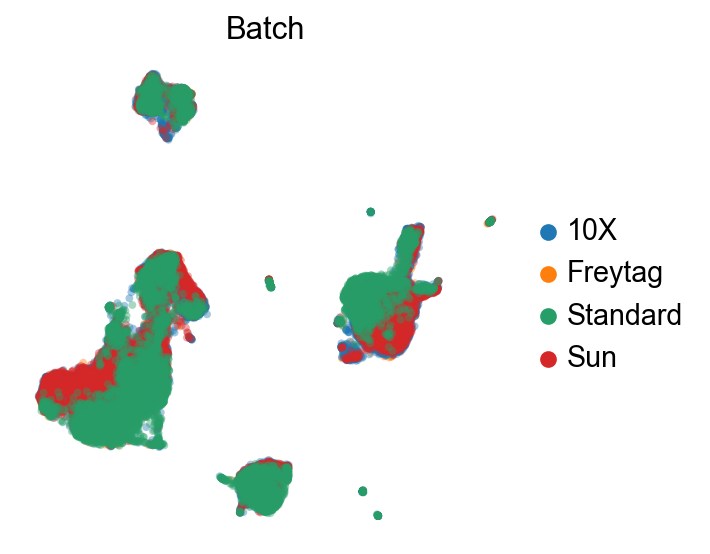

In [49]:
#concat the batches for Sun 
full_latent.obs["Batch"] = ['Sun' if x.startswith('Sun') else x for x in full_latent.obs['batch']]
full_latent.obs['Batch'].value_counts()

#plot
sc.set_figure_params(figsize=(4,4))
sc.pl.umap(
    full_latent,
    color=['Batch'],
    alpha=0.4,
    frameon=False,
    wspace=0.6,
    size=50
)

/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/scanpy/_settings.py:447: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  IPython.display.set_matplotlib_formats(*ipython_format)


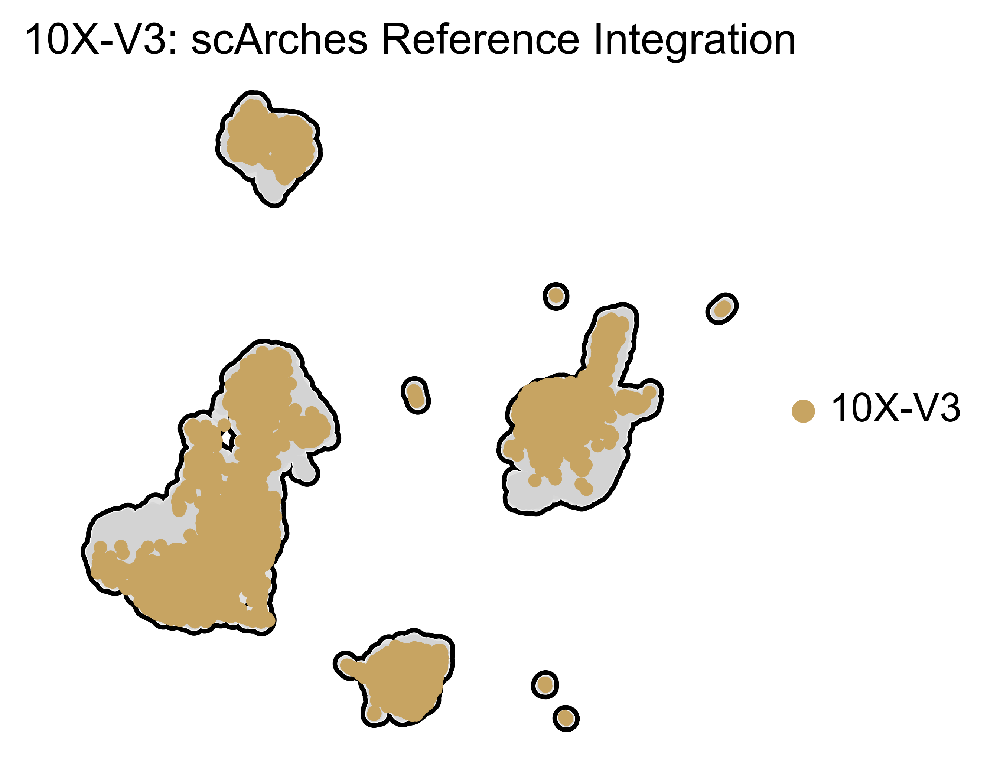

In [59]:
#plot scCLEAN over the reference
standard = full_latent[full_latent.obs['Batch']=='Standard']
ref_adata = full_latent[full_latent.obs['Batch']!='Standard']
standard.uns['Batch_colors'] = np.array(['#C7A462'])
standard.obs['Batch'] = '10X-V3'

sc.set_figure_params(dpi=300, figsize=(4,4), dpi_save=300)
ax = sc.pl.umap(ref_adata, size=100, show=False, add_outline=True)
sc.pl.umap(
    standard ,
    size=75,
    color = 'Batch',
    title='10X-V3: scArches Reference Integration',
    ax=ax,
    save='UMAP_ARCH_10xv3_Reference_Background.png',
    frameon=False, palette=['#C7A462'],
)


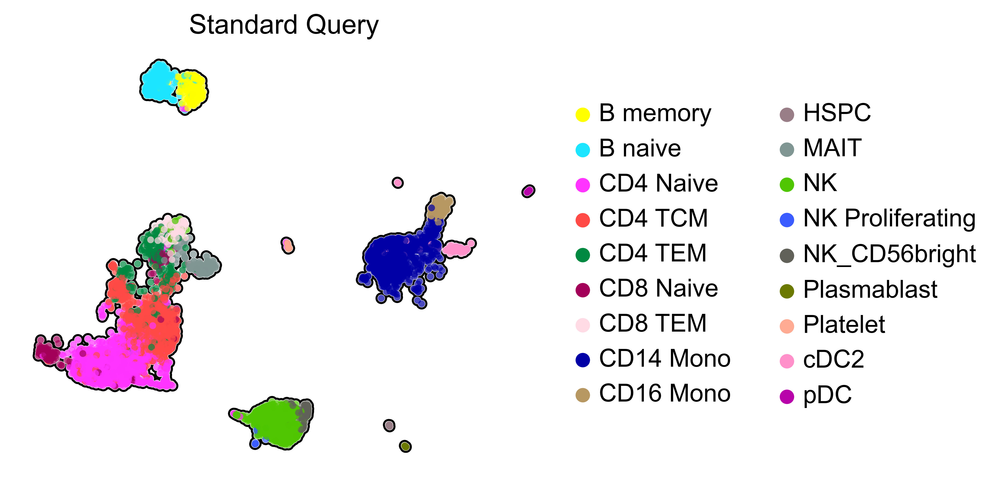

In [29]:
sc.pl.umap(
    scCLEAN,
    size=50,
    color = 'cell_type',
    title='10X-V3 Query',
    frameon=False, 
    color_map='tab20',
    save='UMAP_ARCH_10xv3_Query.png',
    add_outline=True
)


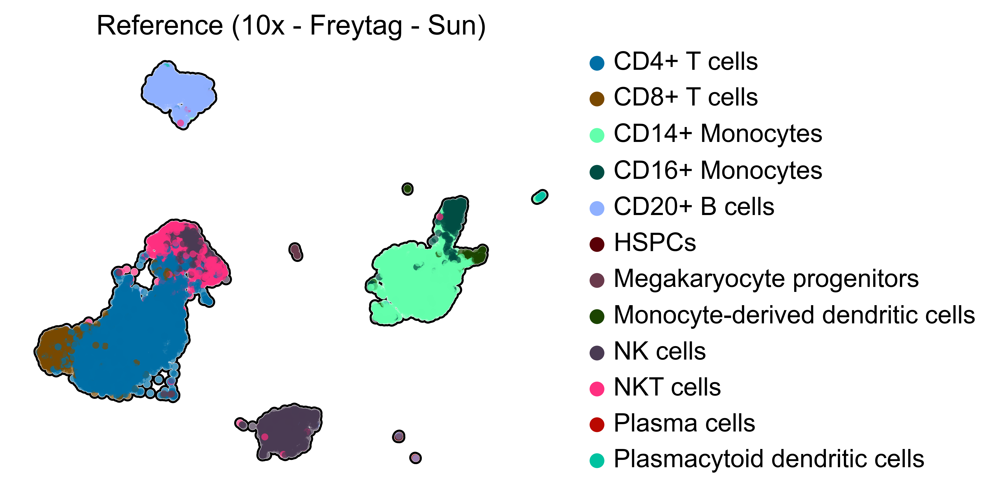

In [30]:
sc.pl.umap(
    ref_adata,
    size=50,
    color = 'cell_type',
    title='Reference (10x - Freytag - Sun)',
    frameon=False, 
    color_map='tab20',
    save='UMAP_ARCH_Reference.png',
    add_outline=True
)


In [31]:
#save the combined latent representation 
full_latent.write('scArches_reference_mapping/Full_latent_Standard_combined_Visualization.h5ad')

After both models are saved 

can utilize treeArches to create the heirarchy and compare the cell types



# compare cell labels to tree heirarchy 

In [60]:
reference_latent

AnnData object with n_obs × n_vars = 22811 × 10
    obs: 'cell_type', 'batch', 'leiden'
    uns: 'neighbors', 'leiden', 'umap', 'batch_colors', 'cell_type_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

In [61]:
#Now make the tree with the reference
reference_latent.obs["Batch"] = ['Sun' if x.startswith('Sun') else x for x in reference_latent.obs['batch']]

#need to break down into seperate matrices then concatenate them again 
reference_latent.obs['study'] = reference_latent.obs['Batch'].astype('category')

# Reorder categories, so smallest dataset is plotted on top
reference_latent.obs['study'].cat.reorder_categories(['Sun', 'Freytag', '10X'], inplace=True)

#add cell labels that are unique to each study 
reference_latent.obs['celltype_batch'] = np.char.add(np.char.add(np.array(reference_latent.obs['cell_type'], dtype= str), '-'),
                                             np.array(reference_latent.obs['study'], dtype=str))

/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_62339/2767176870.py:8: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  reference_latent.obs['study'].cat.reorder_categories(['Sun', 'Freytag', '10X'], inplace=True)


Starting tree:


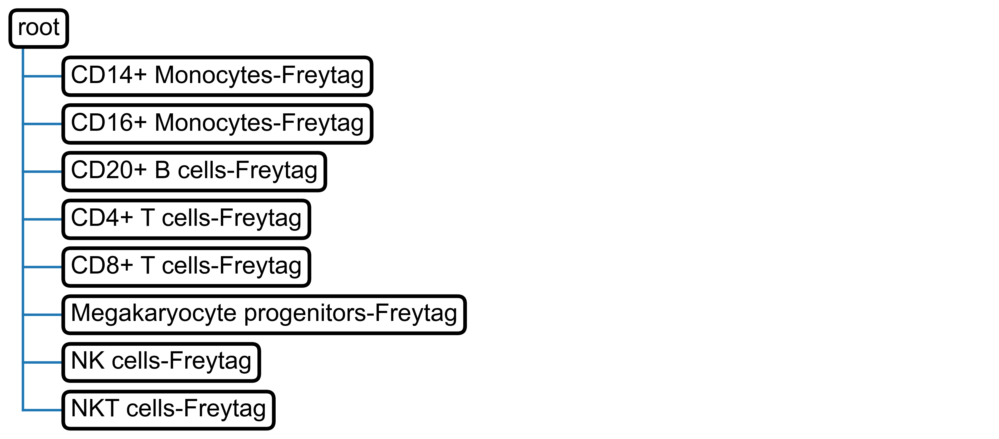


Adding dataset Sun to the tree

Updated tree:


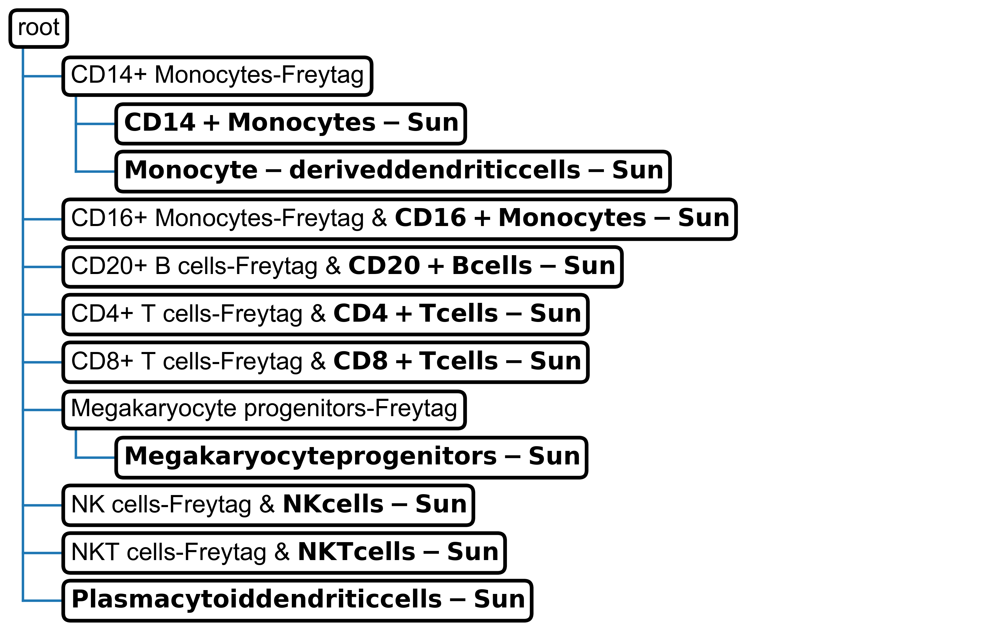


Adding dataset 10X to the tree

Updated tree:


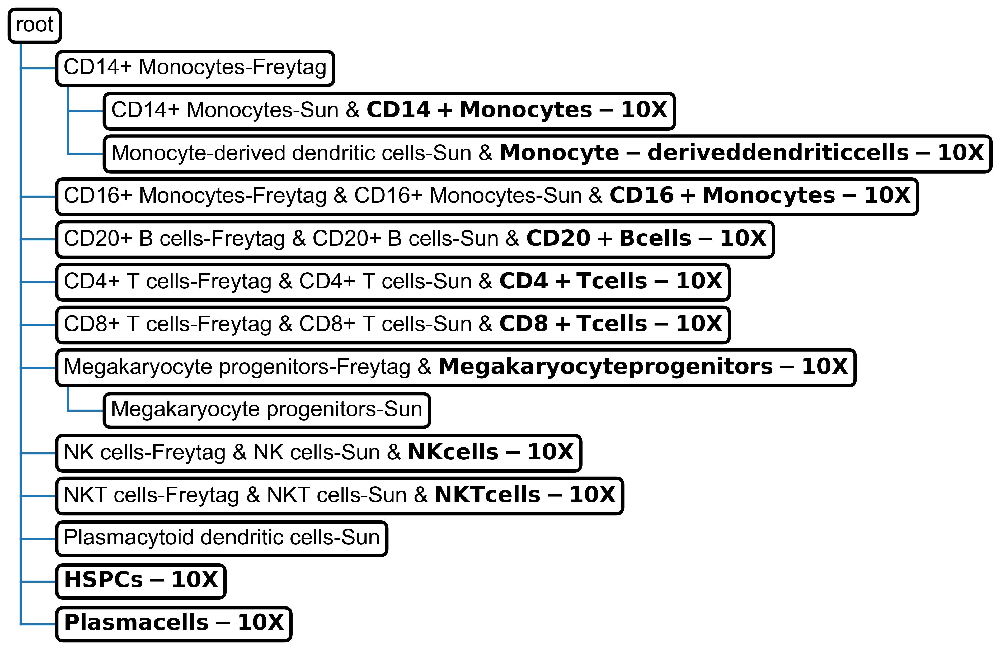

In [62]:
tree_ref, mp_ref = sca.classifiers.scHPL.learn_tree(data = reference_latent,
                batch_key = 'study',
                batch_order = ['Freytag', 'Sun', '10X'],
                cell_type_key='celltype_batch',
                classifier = 'knn', dynamic_neighbors=True,
                dimred = False, print_conf= False)

Now add the scCLEAN samples to the heirarchy

In [63]:
full_latent.obs

,cell_type,batch,leiden,Batch
0,CD8+ T cells,Freytag,6,Freytag
1,CD4+ T cells,Freytag,2,Freytag
2,NKT cells,Freytag,5,Freytag
3,CD4+ T cells,Freytag,1,Freytag
4,CD4+ T cells,Freytag,2,Freytag
...,...,...,...,...
32990,B naive,Standard,4,Standard
32991,CD16 Mono,Standard,8,Standard
32992,CD4 Naive,Standard,1,Standard
32993,NK,Standard,3,Standard


In [64]:
#make sure the added datasets are unique
full_latent.obs['celltype_batch'] = np.char.add(np.char.add(np.array(full_latent.obs['cell_type'], dtype= str), '-'),
                                             np.array(full_latent.obs['Batch'], dtype=str))

Starting tree:


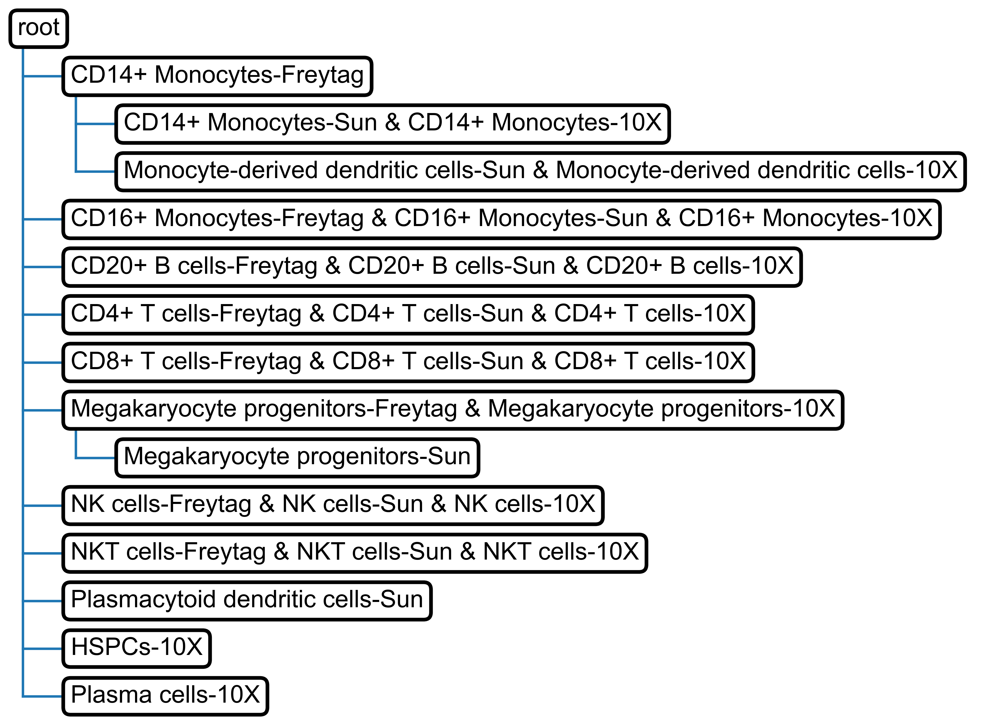


Adding dataset Standard to the tree

Updated tree:


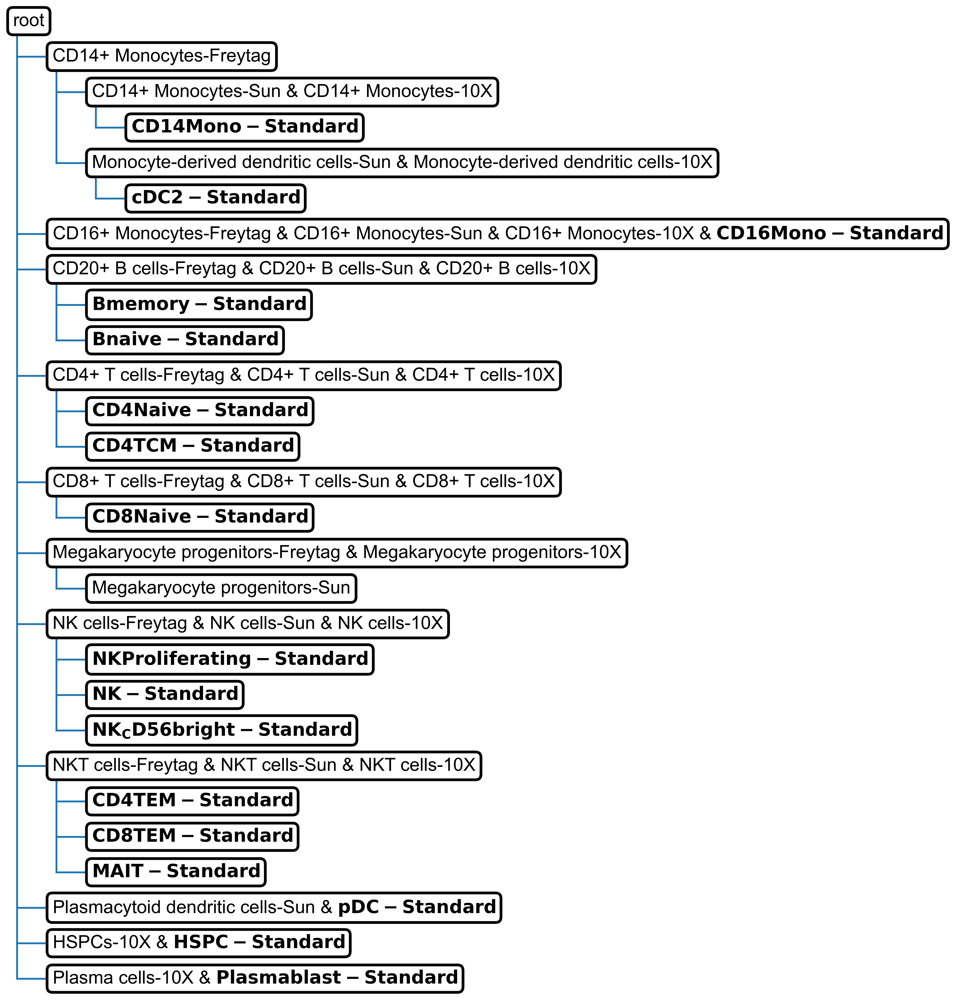

In [65]:
# First make a deep copy of the original classifier to ensure we do not overwrite it
tree_rq = cp.deepcopy(tree_ref)

tree_rq, mp_rq = sca.classifiers.scHPL.learn_tree(data = full_latent, batch_key = 'Batch',
                 batch_order = ['Standard'],
                 batch_added = ['10X', 'Freytag', 'Sun'],
                 cell_type_key='celltype_batch',
                 tree = tree_rq, retrain = False,
                classifier = 'knn',
                dimred = False)

predict the cell type labels from the reference 

show how the labels match up 

In [66]:
#Sankey function from scArches
import collections
import colorsys
import seaborn as sns
import matplotlib.pyplot
import matplotlib.path
import matplotlib.patches

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42

def get_distinct_colors(n):
    # Use colorblind colorpalette
    x = sns.color_palette('colorblind', n_colors=n)
    return x

def text_width(fig, ax, text, fontsize):
    text = ax.text(-100, 0, text, fontsize=fontsize)
    text_bb = text.get_window_extent(renderer=fig.canvas.get_renderer())
    text_bb = text_bb.transformed(fig.dpi_scale_trans.inverted())
    width = text_bb.width
    text.remove()
    return width


class Sankey:
    def __init__(self, x, y,
                 plot_width=10,
                 plot_height=14,
                 gap=0.12,
                 alpha=0.3,
                 fontsize='small',
                 left_order=None,
                 mapping=None,
                 tag=None,
                 title=None,
                 title_left=None,
                 title_right=None,
                 ax=None
    ):
        self.X = x
        self.Y = y
        if ax:
            self.plot_width = ax.get_position().width * ax.figure.get_size_inches()[0]
            self.plot_height = ax.get_position().height * ax.figure.get_size_inches()[1]
        else:
            self.plot_width = plot_width
            self.plot_height = plot_height
        self.gap = gap
        self.alpha = alpha
        self.fontsize = fontsize
        self.tag = tag
        self.map = mapping is not None
        self.mapping = mapping
        self.mapping_colors = {
            'increase': '#1f721c',
            'decrease': '#ddc90f',
            'mistake': '#dd1616',
            'correct': '#dddddd',
            'novel': '#59a8d6',
        }
        self.title = title
        self.title_left = title_left
        self.title_right = title_right

        self.need_title = any(map(lambda x: x is not None, (title, title_left, title_right)))
        if self.need_title:
            self.plot_height -= 0.5

        self.init_figure(ax)

        self.flows = collections.Counter(zip(x, y))
        self.init_nodes(left_order)

        self.init_widths()
        # inches per 1 item in x and y
        self.resolution = (plot_height - gap * (len(self.left_nodes) - 1)) / len(x)
        self.colors = {
            name: colour
            for name, colour
            in zip(self.left_nodes.keys(),
                   get_distinct_colors(len(self.left_nodes)))
        }

        self.init_offsets()

    def init_figure(self, ax):
        self.fig = matplotlib.pyplot.figure()
        self.ax = matplotlib.pyplot.Axes(self.fig, [0, 0, 1, 1])
        self.fig.add_axes(self.ax)
#         self.fig = ax.figure
#         self.ax = ax

    def init_nodes(self, left_order):
        left_nodes = {}
        right_nodes = {}
        left_offset = 0
        for (left, right), flow in self.flows.items():
            if left in left_nodes:
                left_nodes[left] += flow
            else:
                left_nodes[left] = flow
            if right in right_nodes:
                node = right_nodes[right]
                node[0] += flow
                if flow > node[2]:
                    node[1] = left
                    node[2] = flow
            else:
                right_nodes[right] = [flow, left, flow]

        self.left_nodes = collections.OrderedDict()
        self.left_nodes_idx = {}
        if left_order is None:
            key = lambda pair: -pair[1]
        else:
            left_order = list(left_order)
            key = lambda pair: left_order.index(pair[0])

        for name, flow in sorted(left_nodes.items(), key=key):
            self.left_nodes[name] = flow
            self.left_nodes_idx[name] = len(self.left_nodes_idx)

        left_names = list(self.left_nodes.keys())
        self.right_nodes = collections.OrderedDict()
        self.right_nodes_idx = {}
        for name, node in sorted(
            right_nodes.items(),
            key=lambda pair: (left_names.index(pair[1][1]), -pair[1][2])
        ):
            self.right_nodes[name] = node[0]
            self.right_nodes_idx[name] = len(self.right_nodes_idx)

    def init_widths(self):
        self.left_width = max(
            (text_width(self.fig,
                        self.ax,
                        node,
                        self.fontsize) for node in self.left_nodes)
        )
        if self.title_left:
            self.left_width = max(
                self.left_width,
                text_width(self.fig, self.ax, self.title_left, self.fontsize) / 2
            )
        self.right_width = max(
            (text_width(self.fig,
                        self.ax,
                        node,
                        self.fontsize) for node in self.right_nodes)
        )
        if self.title_right:
            self.right_width = max(
                self.right_width,
                text_width(self.fig, self.ax, self.title_right, self.fontsize) / 2
            )

        self.right_stop = self.plot_width - self.left_width - self.right_width
        self.middle1_stop = self.right_stop * 9 / 20
        self.middle2_stop = self.right_stop * 11 / 20

    def init_offsets(self):
        self.offsets_l = {}
        self.offsets_r = {}

        offset = 0
        for name, flow in self.left_nodes.items():
            self.offsets_l[name] = offset
            offset += flow * self.resolution + self.gap

        offset = 0
        for name, flow in self.right_nodes.items():
            self.offsets_r[name] = offset
            offset += flow * self.resolution + self.gap

    def draw_flow(self, left, right, flow, node_offsets_l, node_offsets_r):
        P = matplotlib.path.Path

        flow *= self.resolution
        left_y = self.offsets_l[left] + node_offsets_l[left]
        right_y = self.offsets_r[right] + node_offsets_r[right]
        if self.need_title:
            left_y += 0.5
            right_y += 0.5
        node_offsets_l[left] += flow
        node_offsets_r[right] += flow
        color = self.colors[left]
        if self.mapping is not None:
            color = self.mapping_colors[self.mapping.category(left, right)]

        path_data = [
            (P.MOVETO, (0, -left_y)),
            (P.LINETO, (0, -left_y - flow)),
            (P.CURVE4, (self.middle1_stop, -left_y - flow)),
            (P.CURVE4, (self.middle2_stop, -right_y - flow)),
            (P.CURVE4, (self.right_stop, -right_y - flow)),
            (P.LINETO, (self.right_stop, -right_y)),
            (P.CURVE4, (self.middle2_stop, -right_y)),
            (P.CURVE4, (self.middle1_stop, -left_y)),
            (P.CURVE4, (0, -left_y)),
            (P.CLOSEPOLY, (0, -left_y)),
        ]
        codes, verts = zip(*path_data)
        path = P(verts, codes)
        patch = matplotlib.patches.PathPatch(
            path,
            facecolor=color,
            alpha=0.9 if flow < .02 else self.alpha,
            edgecolor='none',
        )
        self.ax.add_patch(patch)

    def draw_label(self, label, is_left):
        nodes = self.left_nodes if is_left else self.right_nodes
        offsets = self.offsets_l if is_left else self.offsets_r
        y = offsets[label] + nodes[label] * self.resolution / 2
        if self.need_title:
            y += 0.5

        self.ax.text(
            -.1 if is_left else self.right_stop + .1,
            -y,
            label,
            horizontalalignment='right' if is_left else 'left',
            verticalalignment='center',
            fontsize=self.fontsize,
        )

    def draw_titles(self):
        if self.title:
            self.ax.text(
                self.right_stop / 2,
                -0.25,
                self.title,
                horizontalalignment="center",
                verticalalignment="center",
                fontsize=self.fontsize,
                fontweight="bold"
            )
        if self.title_left:
            self.ax.text(
                -.1,
                -0.25,
                self.title_left,
                horizontalalignment="right",
                verticalalignment="center",
                fontsize=self.fontsize
            )
        if self.title_right:
            self.ax.text(
                self.right_stop + .1,
                -0.25,
                self.title_right,
                horizontalalignment="left",
                verticalalignment="center",
                fontsize=self.fontsize
            )

    def draw(self, save, name_file):
        node_offsets_l = collections.Counter()
        node_offsets_r = collections.Counter()

        for (left, right), flow in sorted(
            self.flows.items(),
            key=lambda pair: (self.left_nodes_idx[pair[0][0]],
                              self.right_nodes_idx[pair[0][1]])
        ):
            self.draw_flow(left, right, flow, node_offsets_l, node_offsets_r)

        for name in self.left_nodes:
            self.draw_label(name, True)
        for name in self.right_nodes:
            self.draw_label(name, False)
        self.draw_titles()

        self.ax.axis('equal')
        self.ax.set_xlim(-self.left_width - self.gap,
                         self.right_stop + self.gap + self.right_width)
        self.ax.get_xaxis().set_visible(False)
        self.ax.get_yaxis().set_visible(False)
        for k in self.ax.spines.keys():
            self.ax.spines[k].set_visible(False)
            
        matplotlib.pyplot.axis('off')
        self.fig.set_figheight(self.plot_height)
        self.fig.set_figwidth(self.plot_width)
        
        if self.tag:
            text_ax = self.fig.add_axes((0.02, 0.95, 0.05, 0.05), frame_on=False)
            text_ax.set_axis_off()
            matplotlib.pyplot.text(0, 0, self.tag, fontsize=30, transform=text_ax.transAxes)
        if save:
            matplotlib.pyplot.savefig(name_file + '.pdf', bbox_inches='tight')
        matplotlib.pyplot.tight_layout()


def sankey(x, y, save=False, name_file='sankey', **kwargs):
    diag = Sankey(x, y, **kwargs)
    diag.draw(save, name_file)
    return diag.fig

In [67]:
#predict labels
query_pred = sca.classifiers.scHPL.predict_labels(query_latent.X, tree=tree_ref)

In [68]:
#simplify labels
query_pred[query_pred == 'Monocyte-derived dendritic cells-Sun'] = 'Monocyte derived dendritic cells-Sun'

#collapse labels by batch
query_pred_refined = []
for cell_name in query_pred:
    if '-' in cell_name:
        name1,name2 = cell_name.split('-')
        query_pred_refined.append(name1)
    else:
        query_pred_refined.append(cell_name)


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/seaborn/matrix.py:306: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  mesh = ax.pcolormesh(self.plot_data, cmap=self.cmap, **kws)
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/seaborn/matrix.py:316: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = ax.figure.colorbar(mesh, cax, ax, **self.cbar_kws)


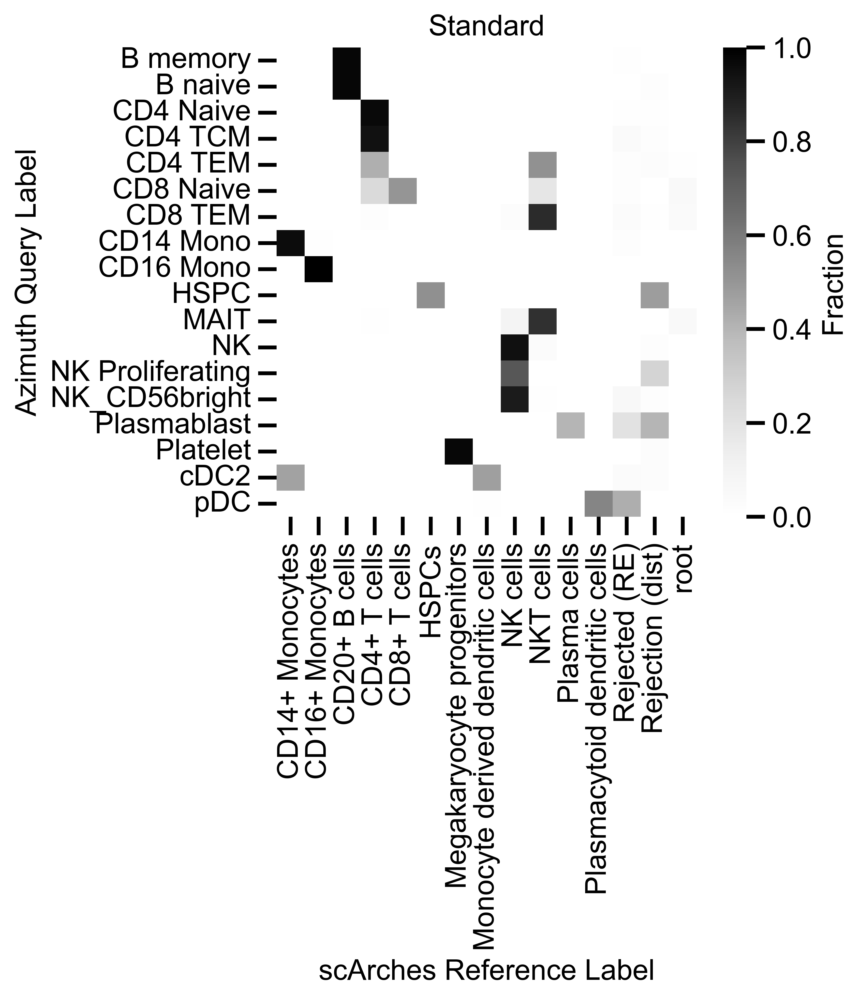

In [69]:
#plot heatmap 
sns_plot = sca.classifiers.scHPL.evaluate.heatmap(query_latent.obs['cell_type'], query_pred_refined, shape=[6,7],
                                       cmap='Greys',title='Standard',
                                      xlabel='scArches Reference Label', ylabel='Azimuth Query Label')
plt.tight_layout()
sns_plot.savefig("scArches_reference_mapping/Heatmap_scArches_Standard.png")

In [70]:
#add predicted cell types as annotation label 
query_latent.obs['predicted'] = query_pred_refined
#combine the two types of rejected categories
idx_rej = ((query_latent.obs['predicted'] == 'Rejection (dist)') | (query_latent.obs['predicted'] == 'Rejected (RE)'))
query_latent.obs['Predicted'] = query_latent.obs['predicted'].astype('category').cat.add_categories('Rejected')
query_latent.obs['Predicted'].values[idx_rej] = 'Rejected'

#get the order according to abundance of labeled cell types
cell_order = pd.DataFrame(query_latent.obs['cell_type'].value_counts().index)
cell_order = list(cell_order[0])

In [71]:
#name_file='sankey_IPF', save=True,
x = sankey(query_latent.obs['cell_type'],
                  query_latent.obs['Predicted'],
                  title="Standard", title_left="Azimuth Annotated",
                  title_right="scArches Predicted", alpha=0.7,
                  save=True, name_file='scArches_reference_mapping/Sankey_Standard_scArches',
                  left_order=cell_order, fontsize='medium')

/var/folders/fv/spz1kmdd6fzcpgwh4n4pgtxh0000gn/T/ipykernel_62339/1737538730.py:294: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  matplotlib.pyplot.tight_layout()


Calculate the scib batch integration metrics: kBET, graph connectivity, and ASW

compare query integrated and not integrated

the leiden results will be used as cluster labeling

All metrics range from 0-1: with 1 representing better integration 

In [72]:
#replace the Azimuth annotations for the predicted labels in order to properly calc batch metrics
scCLEAN.obs = scCLEAN.obs.reset_index()
scCLEAN.obs['cell_type'] = list(query_latent.obs['Predicted'])
scCLEAN.obs = scCLEAN.obs.drop('index',axis=1)

#merge the reference and the scCLEAN into one anndata 
full_latent = anndata.concat([scCLEAN,ref_adata])

#compute knn on umap embedding
sc.pp.neighbors(full_latent, use_rep='X_umap')
full_latent.obs = full_latent.obs.astype('category')

/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/_core/anndata.py:798: UserWarning: 
AnnData expects .obs.index to contain strings, but got values like:
    [0, 1, 2, 3, 4]

    Inferred to be: mixed-integer

  value_idx = self._prep_dim_index(value.index, attr)


In [73]:
#batch integration metrics for reference with scCLEAN query 
connect = scib.me.graph_connectivity(full_latent, label_key="cell_type")
print('\nthe graph connectivity metric including scCLEAN query is: '+str(connect) +'\n')

kbet = scib.me.kBET(full_latent, batch_key="Batch", label_key="cell_type", type_="knn")
print('\nthe kBET score including scCLEAN query is: '+str(kbet) +'\n')

ASW = scib.me.silhouette_batch(full_latent, batch_key="Batch", label_key="cell_type", embed='X_umap')
print('\nthe silhouette score including scCLEAN query is: '+str(ASW) +'\n')


the graph connectivity metric including scCLEAN query is: 0.8042234497574978

Adding diffusion to step 2
Adding diffusion to step 3
Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (32995×32995).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (12919×12919).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


Adding diffusion to step 4


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4
Adding diffusion to step 5


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7
Adding diffusion to step 8


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Monocyte derived dendritic cells consists of a single batch or is too small. Skip.
Rejected consists of a single batch or is too small. Skip.


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (32995×32995).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (99×99).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release

root consists of a single batch or is too small. Skip.


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (32995×32995).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (32995×32995).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be d

Adding diffusion to step 4
Adding diffusion to step 5

the kBET score including scCLEAN query is: 0.3258747880152232

mean silhouette per group:                                   silhouette_score
group                                             
CD14+ Monocytes                           0.787985
CD16+ Monocytes                           0.753187
CD20+ B cells                             0.903949
CD4+ T cells                              0.864164
CD8+ T cells                              0.651432
HSPCs                                     0.854946
Megakaryocyte progenitors                 0.271119
Monocyte-derived dendritic cells          0.610960
NK cells                                  0.480525
NKT cells                                 0.800368
Plasma cells                              0.102105
Plasmacytoid dendritic cells              0.098996

the silhouette score including scCLEAN query is: 0.5983114395448462



In [74]:
#compute knn over umap embedding
sc.pp.neighbors(ref_adata, use_rep='X_umap')

#batch integration metrics for reference without scCLEAN query 
connect2 = scib.me.graph_connectivity(ref_adata, label_key="cell_type")
print('\nthe graph connectivity metric including only the reference is: '+str(connect2) +'\n')

kbet2 = scib.me.kBET(ref_adata, batch_key="Batch", label_key="cell_type", type_="knn")
print('\nthe kBET score including only the reference is: '+str(kbet2) +'\n')

ASW2 = scib.me.silhouette_batch(ref_adata, batch_key="Batch", label_key="cell_type", embed='X_umap')
print('\nthe silhouette score including only the reference is: '+str(ASW2) +'\n')


the graph connectivity metric including only the reference is: 0.9173320561638504

Adding diffusion to step 2
Adding diffusion to step 3
Adding diffusion to step 4
Adding diffusion to step 5


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (22811×22811).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (1198×1198).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6
Adding diffusion to step 7


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/pandas2ri.py:356: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/numpy2ri.py:245: DeprecationWarning: The global conversion available with activate() is deprecated and will be removed in the next major release. Use a local converter.
  warnings.warn('The global conversion available with activate() '
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/rpy2/robjects/conversion.py:28: DeprecationWarning: The use of converter in module rpy2.robjects.conversion is deprecated. Use rpy2.robjects.conversion.get_conversion() instead of rpy2.robjects.conversion.converter.
  warnings.warn(
/Users/jbezney/opt/anaconda3/envs/scarches/lib/python

Adding diffusion to step 4
Adding diffusion to step 5
Adding diffusion to step 6


/Users/jbezney/opt/anaconda3/envs/scarches/lib/python3.8/site-packages/anndata/compat/__init__.py:263: FutureWarning: During AnnData slicing, found matrix at .uns['neighbors']['diffusion_connectivities'] that happens to be dimensioned at n_obs×n_obs (22811×22811).

These matrices should now be stored in the .obsp attribute.
This slicing behavior will be removed in anndata 0.8.
  warn(


HSPCs consists of a single batch or is too small. Skip.
Plasma cells consists of a single batch or is too small. Skip.
Plasmacytoid dendritic cells consists of a single batch or is too small. Skip.

the kBET score including only the reference is: 0.49704372691529586

mean silhouette per group:                                   silhouette_score
group                                             
CD14+ Monocytes                           0.901585
CD16+ Monocytes                           0.790092
CD20+ B cells                             0.887089
CD4+ T cells                              0.877687
CD8+ T cells                              0.731137
Megakaryocyte progenitors                 0.276608
Monocyte-derived dendritic cells          0.610960
NK cells                                  0.899922
NKT cells                                 0.776030

the silhouette score including only the reference is: 0.7501234306154791

